In [42]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as colors
from imagingIO import loopMice, loadData, loadBeh, getBeh
from analysis import dffCalc, filtData, smoothData, normData
from events import getEvents
from trials import markTrials
from bouts import getBouts, getBoutDur, getBouts_
from statistics import stdCalc, getBoutMeans, getStats, getBoutMeans_
from plotter import plotMean, plotHeat, plotTrials

In [2]:
# Start gathering the data from FR1 exp
# Mice
mice = [(8404, 6), (8857, 3), (8864, 1)]
# Parameters
behType = 'FR1'
fs = 0.05
trials=[1,12]

In [3]:
# Get file paths
fileList = loopMice(mice, behType)

# Load the data
dataList = loadData(mice, behType)

# Load the behaviour
eventList = getBeh(mice, fileList['Behaviour'], behType)

# dFF and plot again
filtList = filtData(mice, dffCalc(mice, dataList, lowest=False), cutoff=5.0, order=6)
dFFList = smoothData(mice, filtList, window=4)

# Normalize the data
normList = normData(mice, dFFList)

In [25]:
# Pick the event
eventType = 'Eat_Start'
base = -10.0
duration = 30.0

# Plot the mean of all
eventsData = markTrials(mice, dFFList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=True)


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.


In [50]:
def giveColors(n):
    cmap = plt.cm.get_cmap('rainbow', n)    # PiYG
    
    colorList = []                 
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colorList.append(colors.rgb2hex(rgb))
        
    return colorList[0:n]

colorList=giveColors(12)
#colorList=colorList.reverse()

In [51]:
colorList

[u'#8000ff',
 u'#5148fc',
 u'#238af5',
 u'#0cc1e8',
 u'#3ae8d7',
 u'#68fcc1',
 u'#97fca7',
 u'#c5e88a',
 u'#f3c16a',
 u'#ff8a48',
 u'#ff4824',
 u'#ff0000']

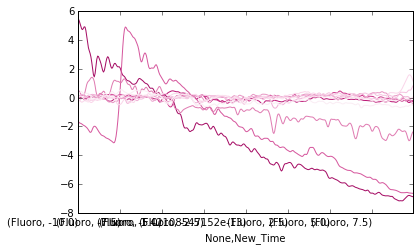

In [24]:
cellNames = eventsData['Cell'].drop_duplicates().values
cell = cellNames[0]
for i in range(1,12):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    df.loc[cell,i].plot(legend=False, subplots=True, color=giveColors(25, 12)[i])

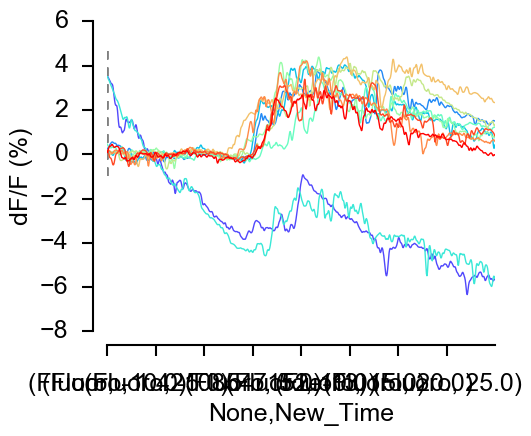

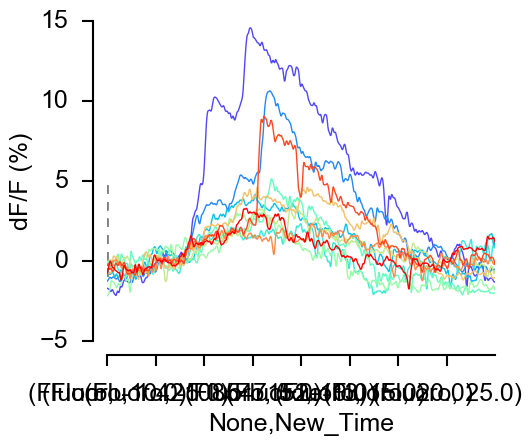

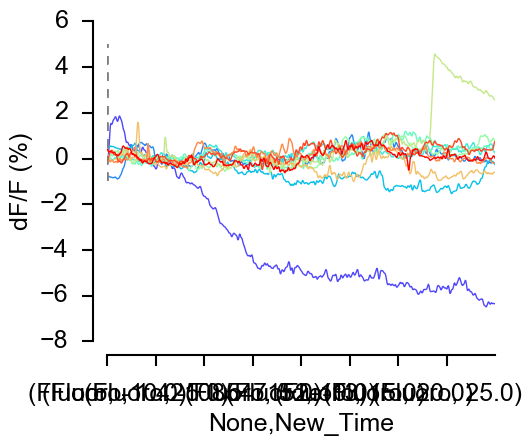

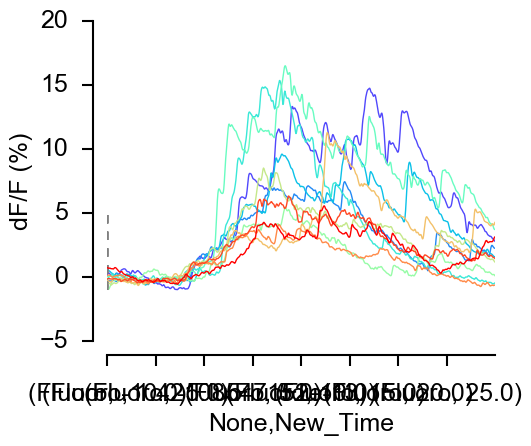

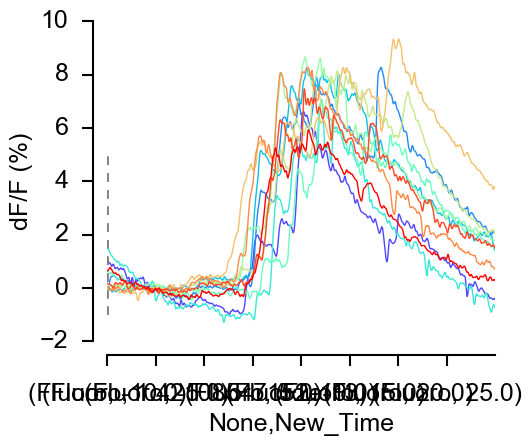

...

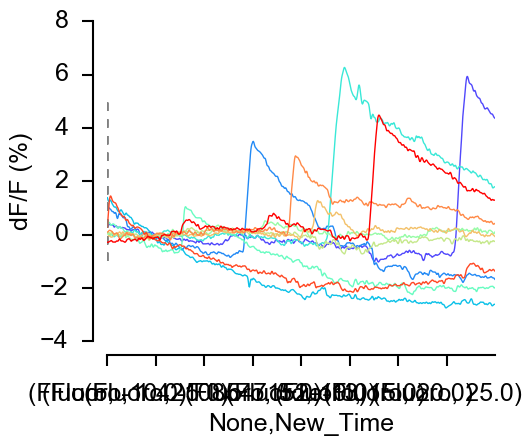

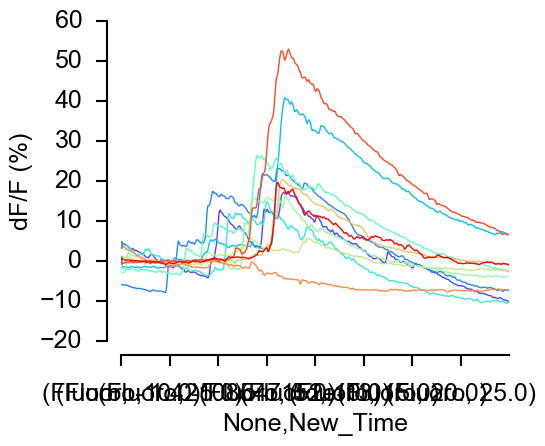

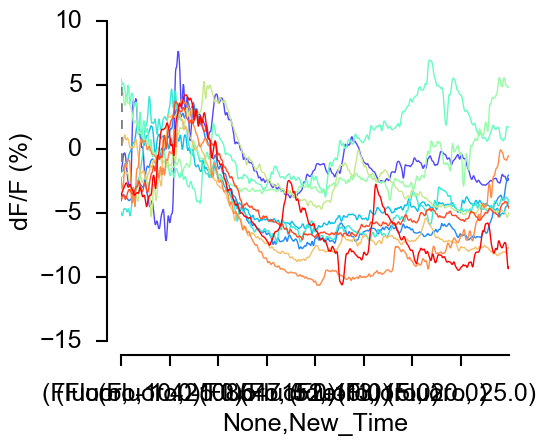

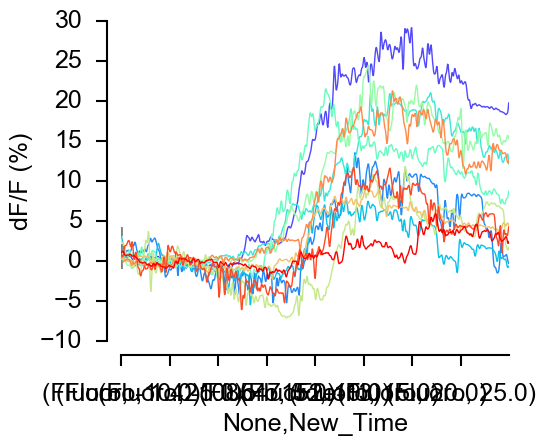

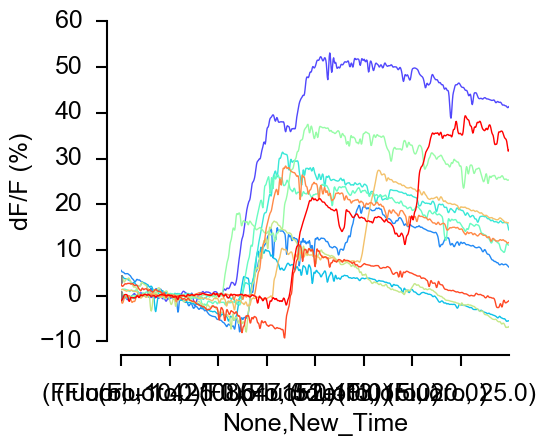

In [52]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
for ind, cell in enumerate(cellNames):
    fig = plt.figure(figsize=(5,4), facecolor="w", dpi= 150)
    
    for i in range(1,12):
        plt.style.use('classic')
        # Set the font dictionaries (for plot title and axis titles)
        font = {'sans-serif' : 'Arial',
                'weight' : 'normal',
                'size'   : 18}
        plt.rc('font', **font)
        
        line = 1.5
        colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
        ax = plt.subplot(111)
        
        ## labels
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("dF/F (%)")
        #ax.set_title("Aligned to event::Update the title", fontsize= 12)

        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()
        
        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()

        ## adjust the spines and ticks
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['left'].set_linewidth(line)
        ax.spines['left'].set_position(('outward', 10))
        ax.spines['bottom'].set_linewidth(line)
        ax.spines['bottom'].set_position(('outward', 10))
        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('left')

        ## decorate the axes
        ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
        ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)
        
        ax.plot([0, 0],[-1, 5], 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
        
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False, subplots=True, color=colorList[i])
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\plots\\5_plots_"+cell+"_"+eventType+".svg"
    fig.savefig(fname)
        
#fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_plots_10sec.svg")
        

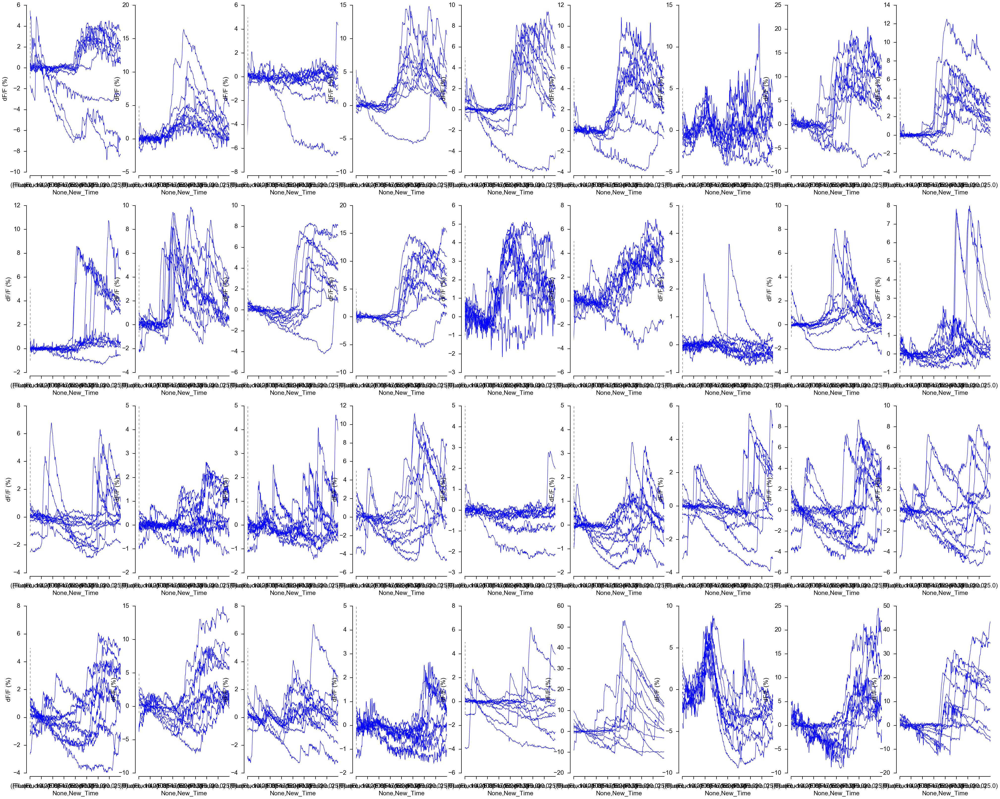

In [7]:
cellNames = eventsData['Cell'].drop_duplicates().values
row = 4
fig = plt.figure(figsize=(50,40), facecolor="w", dpi= 150)
time = np.arange(base,duration,fs)
for ind, cell in enumerate(cellNames):
    
    for i in range(1,12):
        plt.style.use('classic')
        # Set the font dictionaries (for plot title and axis titles)
        font = {'sans-serif' : 'Arial',
                'weight' : 'normal',
                'size'   : 18}
        plt.rc('font', **font)
        
        line = 1.5
        colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
        ax = plt.subplot(row, len(cellNames)/row, ind+1)
        
        ## labels
        ax.set_xlabel("Time (sec)")
        ax.set_ylabel("dF/F (%)")
        #ax.set_title("Aligned to event::Update the title", fontsize= 12)

        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()
        
        ## Remove top axes and right axes ticks
        ax.get_xaxis().tick_top()
        ax.get_yaxis().tick_left()

        ## adjust the spines and ticks
        ax.spines['right'].set_color('none')
        ax.spines['top'].set_color('none')
        ax.spines['left'].set_linewidth(line)
        ax.spines['left'].set_position(('outward', 10))
        ax.spines['bottom'].set_linewidth(line)
        ax.spines['bottom'].set_position(('outward', 10))
        ax.xaxis.set_ticks_position('bottom')
        ax.yaxis.set_ticks_position('left')

        ## decorate the axes
        ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
        ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)
        
        ax.plot([0, 0],[-1, 5], 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
        
        df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
        df.loc[cell,i].plot(legend=False, subplots=True, color=giveColors(25, 12)[i])
        
#fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_plots_10sec.svg")
        

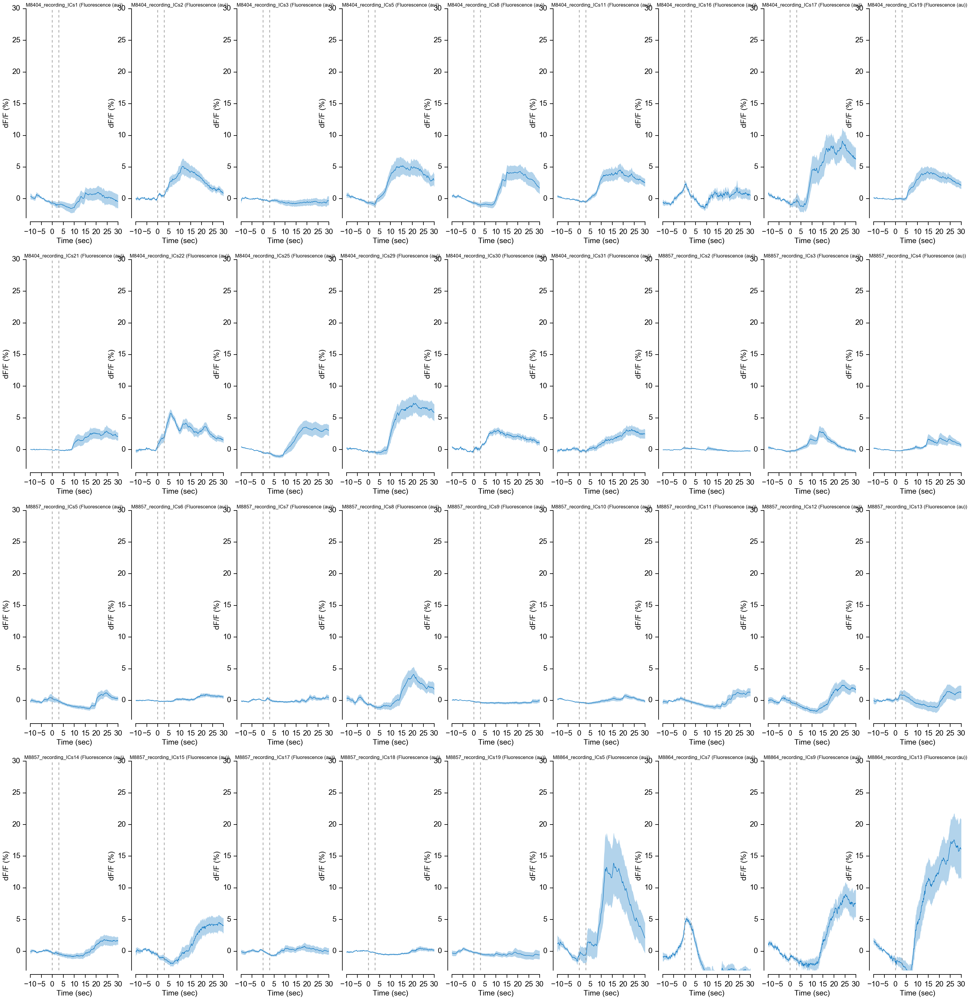

In [18]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

row = 4
fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    ax.fill_between(time, meanCell+semCell, meanCell-semCell, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
    cat, = ax.plot(time, meanCell, colors[1], label=eventType)    
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)

fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_means_10sec.svg")

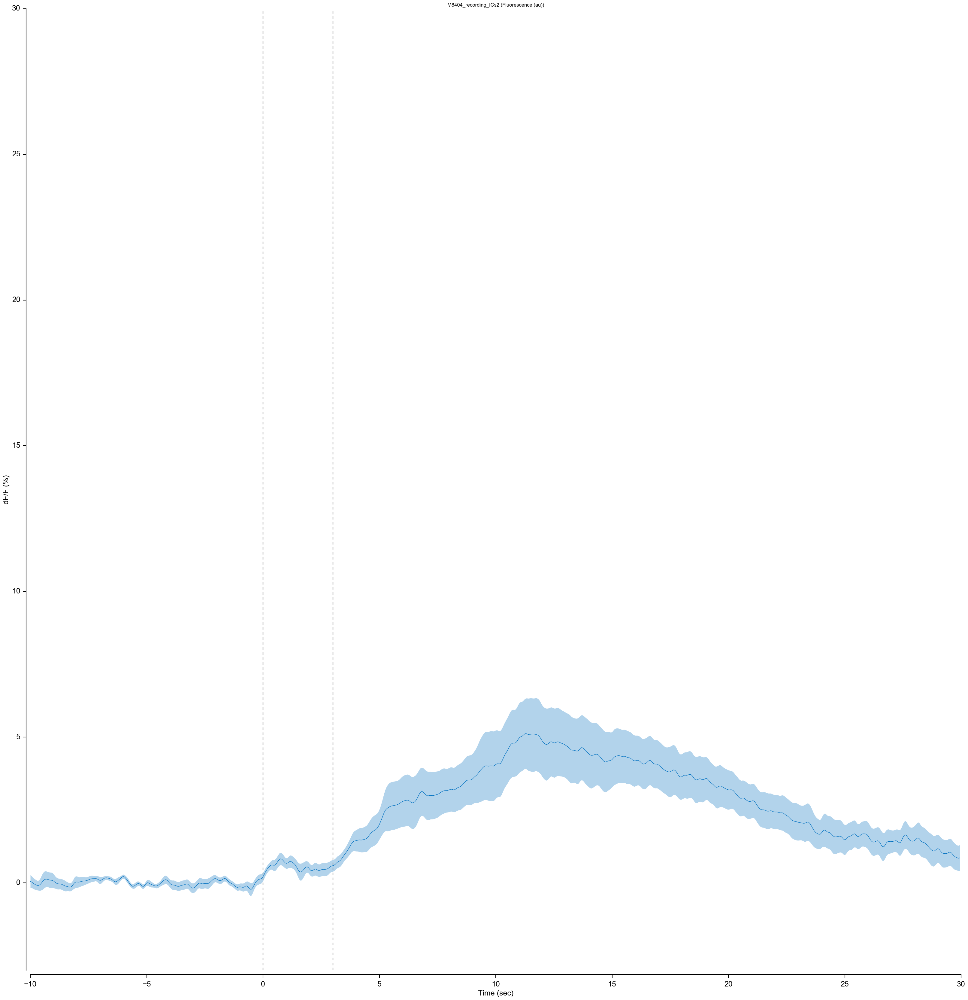

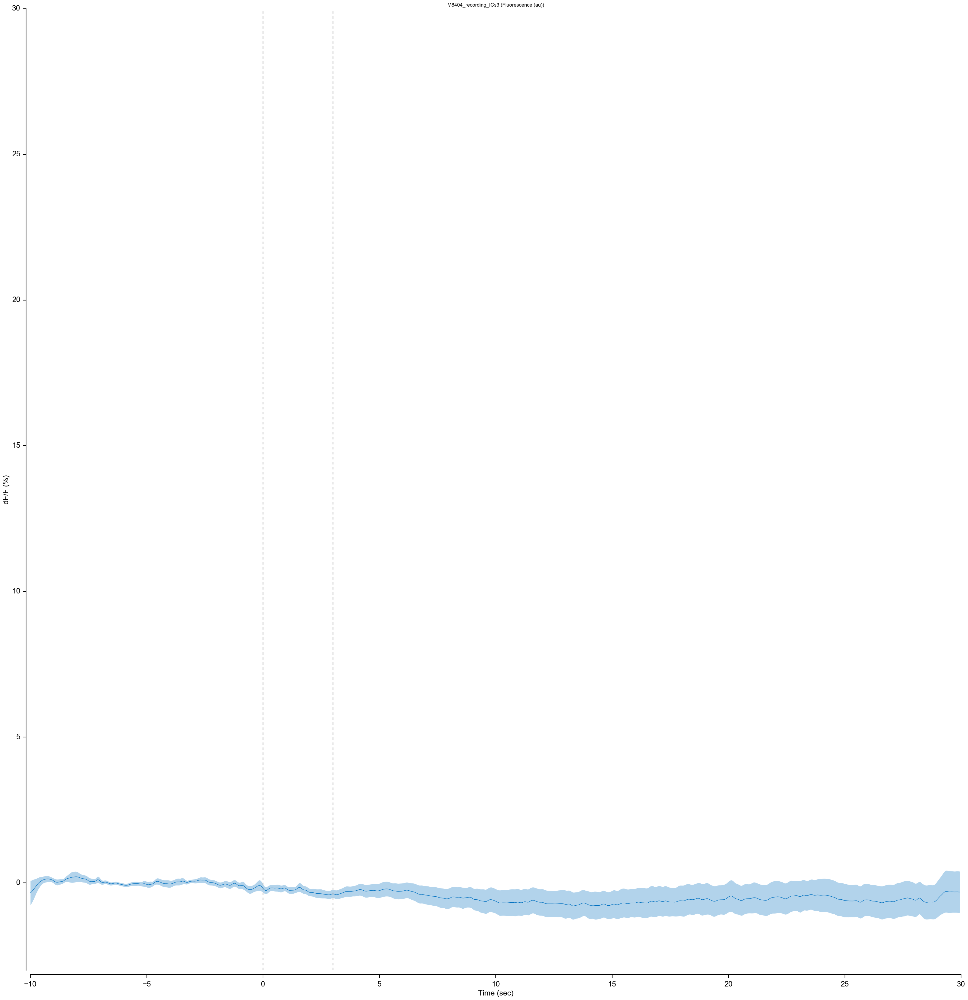

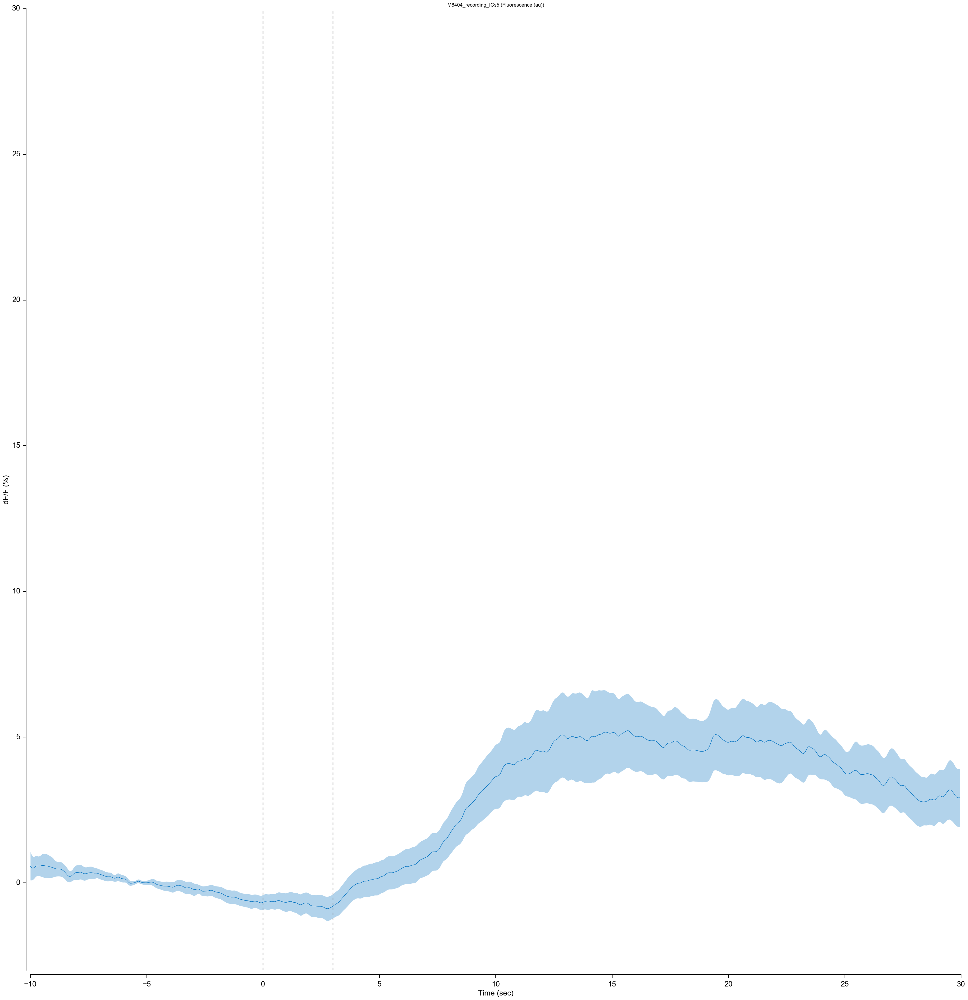

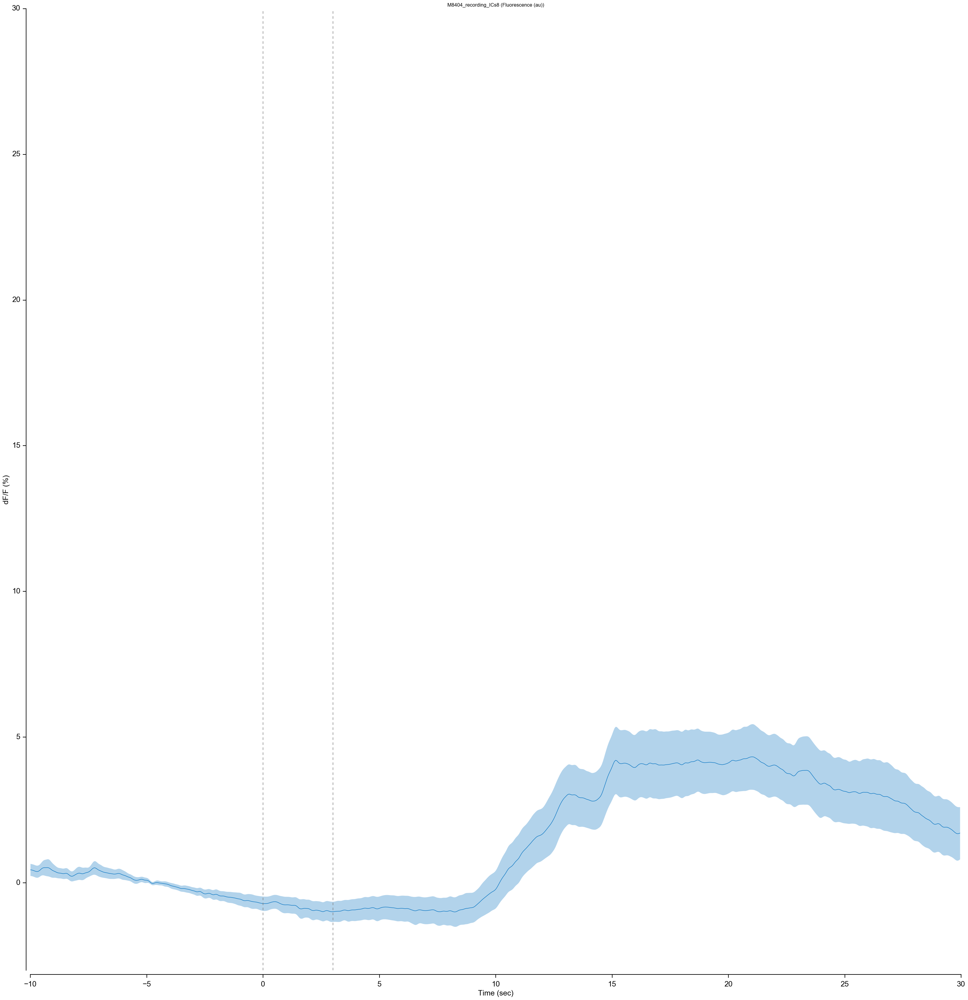

In [51]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

for ind, cell in enumerate(cellNames[1:5]):
    fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(111)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    ax.fill_between(time, meanCell+semCell, meanCell-semCell, facecolor=colors[1], linewidth=0, alpha=0.3, zorder=-5)
    cat, = ax.plot(time, meanCell, colors[1], label=eventType)    
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_means_"+cell+".svg"
    fig.savefig(fname)

In [ ]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
eventsData_norm = markTrials(mice, normList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=False)
heatData = eventsData_norm.pivot_table(index=['Event', 'Cell'], columns='New_Time').values

# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

row = 4
fig = plt.figure(figsize=(40,40), facecolor="w", dpi= 150)
for ind, cell in enumerate(cellNames):
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(row, len(cellNames)/row, ind+1)
    
    ## labels
    ax.set_xlabel("Time (sec)")
    ax.set_ylabel("dF/F (%)")
    #title = "Cell: " + cell + "\n" + "Class: " + statsFR1['Class'].loc[cell]
    ax.set_title(cell, fontsize= 12)

    ## Remove top axes and right axes ticks
    ax.get_xaxis().tick_top()
    ax.get_yaxis().tick_left()

    ## adjust the spines and ticks
    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.spines['left'].set_linewidth(line)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_linewidth(line)
    ax.spines['bottom'].set_position(('outward', 10))
    ax.xaxis.set_ticks_position('bottom')
    ax.yaxis.set_ticks_position('left')

    ## decorate the axes
    ax.tick_params(axis='y', color= '#000000', width= line, direction='out', length= 8, which='major', pad=10)
    ax.tick_params(axis='x', color= '#000000', width= line, direction='out', length= 8, which='major', pad=12)

    plt.pcolor(heatData, cmap=plt.cm.PiYG_r, linewidth=line, linestyle='solid', vmin=0.0, vmax=0.55)
    
    # limits
    lims = [-3, 30]
    ax.set_ylim(lims)
    
    ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)

#fig.savefig("J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\5_eat_start_all_cells_means_10sec.svg")

In [32]:
cellNames = eventsData['Cell'].drop_duplicates().values
time = np.arange(base,duration,fs)
eventsData_norm = markTrials(mice, normList, base=base, duration=duration, eventType=eventType, behType=behType, trials=trials, baselining=False)


3  mice were loaded.
Mouse number 8404  had  15  total rewards.
Mouse number 8857  had  17  total rewards.
Mouse number 8864  had  13  total rewards.


In [28]:
eventsData_norm.pivot_table(index=['Cell', 'Event'], columns='New_Time', values='Fluoro')

New_Time                                           -10.00    -9.95     -9.90   \
Cell                                      Event                                 
M8404_recording_ICs1 (Fluorescence (au))  1      0.589832  0.585008  0.577900   
                                          2      0.045063  0.046080  0.047085   
                                          3      0.039201  0.038882  0.037940   
                                          4      0.277276  0.274801  0.273520   
                                          5      0.163245  0.161458  0.157670   
                                          6      0.035509  0.036506  0.037710   
                                          7      0.044728  0.046399  0.048691   
                                          8      0.025365  0.023629  0.024080   
                                          9      0.026597  0.027267  0.026710   
                                          10     0.037271  0.037451  0.038176   
                                          11     0.064075  0.066572  0.069722   
                                          12     0.125413  0.125849  0.125730   
M8404_recording_ICs11 (Fluorescence (au)) 1      0.028720  0.027729  0.027842   
                                          2      0.074283  0.075207  0.071725   
                                          3      0.137939  0.135149  0.130479   
                                          4      0.099849  0.100643  0.102815   
                                          5      0.638026  0.648657  0.664527   
                                          6      0.084504  0.081831  0.079490   
                                          7      0.088554  0.088141  0.087192   
                                          8      0.127624  0.129428  0.125946   
                                          9      0.133603  0.132628  0.129683   
                                          10     0.129944  0.127675  0.123757   
                                          11     0.276199  0.271951  0.267561   
                                          12     0.275669  0.266320  0.260265   
M8404_recording_ICs16 (Fluorescence (au)) 1      0.242105  0.244588  0.246019   
                                          2      0.171486  0.171042  0.169279   
                                          3      0.253830  0.244758  0.234278   
                                          4      0.134629  0.135592  0.137865   
                                          5      0.393165  0.408543  0.428917   
                                          6      0.102058  0.101100  0.101837   
...                                                   ...       ...       ...   
M8864_recording_ICs5 (Fluorescence (au))  7      0.073879  0.074130  0.074000   
                                          8      0.127693  0.127462  0.127171   
                                          9      0.045217  0.046206  0.046186   
                                          10     0.310849  0.310354  0.309733   
                                          11     0.029076  0.029733  0.029923   
                                          12     0.087289  0.085124  0.083510   
M8864_recording_ICs7 (Fluorescence (au))  1      0.297161  0.294769  0.293349   
                                          2      0.143903  0.147199  0.152941   
                                          3      0.139316  0.132636  0.130446   
                                          4      0.292840  0.295198  0.295759   
                                          5      0.340204  0.343044  0.344131   
                                          6      0.124212  0.131572  0.132328   
                                          7      0.273704  0.267948  0.264302   
                                          8      0.074648  0.074834  0.074812   
                                          9      0.232980  0.230504  0.237733   
                                          10     0.237860  0.237462  0.234876   
                               

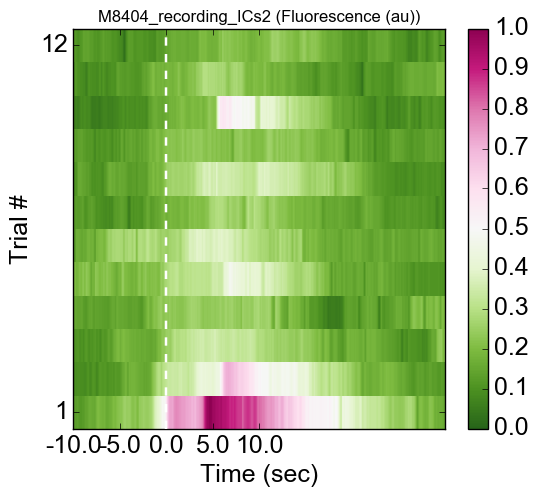

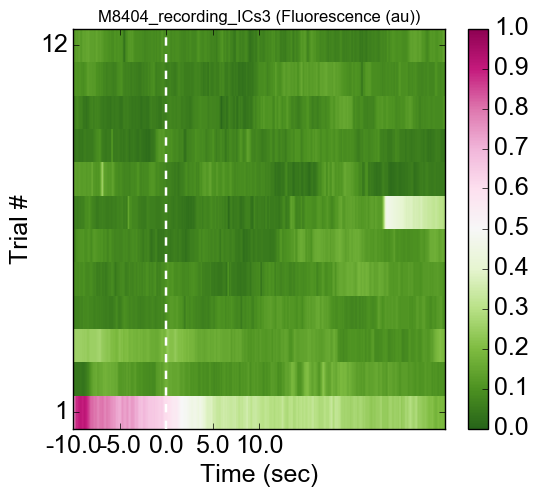

In [58]:
# Start running the analysis
#boutMeansFR1 = getBoutMeans(mice, eventType=['Eat_Start', 'Eat_End'], behType=behType, trials=trials, dff=True, baseline=False, base=base)

for ind, cell in enumerate(cellNames[1:3]):
    fig = plt.figure(figsize=(6,5), facecolor="w", dpi= 150)
    
    df=eventsData.pivot_table(index=['Cell','Event'], columns='New_Time')
    semCell = df.loc[cell].sem(axis=0)
    meanCell = df.loc[cell].mean(axis=0)
    
    plt.style.use('classic')
    # Set the font dictionaries (for plot title and axis titles)
    font = {'sans-serif' : 'Arial',
            'weight' : 'normal',
            'size'   : 18}
    plt.rc('font', **font)

    line = 1.5
    colors = ('#BCBEC0', '#0070C0', '#BCBEC0', '#0070C0')
    
    ax = plt.subplot(111)
    
    ## labels
    ax.set_xlabel('Time (sec)')
    ax.set_ylabel('Trial #')
    ax.set_title(cell, fontsize= 12)


    ## decorate the axes
    time_ax = np.arange(base, duration+0.001, 5.0)
    ax.set_xticks(np.linspace(0, (-base+duration)/fs, len(time_ax)))
    ax.set_xticklabels(time_ax)
    ax.set_yticks(np.linspace(trials[0]-0.5, trials[1]-0.5, 2))
    ax.set_yticklabels(np.linspace(trials[0], trials[1], 2, dtype=int))
    
    heatData = eventsData_norm.pivot_table(index=['Cell', 'Event'], columns='New_Time', values='Fluoro').loc[cell]
    plt.pcolor(heatData, cmap=plt.cm.PiYG_r, linewidth=line, linestyle='solid', vmin=0.0, vmax=1.0)
    plt.colorbar()
   
    #ax.plot([0, 0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    #ax.plot([3.0, 3.0],lims, 'gray', linestyle='--', linewidth=line*1.2, alpha=0.7)
    ax.plot([-base/fs, -base/fs], list(ax.get_ylim()), 'w', linestyle='--', linewidth=line*1.2, alpha=1., zorder=111)
    
    fname = "J:\\Hakan Kucukdereli\\Miniscope_Behaviour_MPIN\\scripts\\figures\\first_draft\\all_cells\\6_means_"+cell+eventType+".svg"
    fig.savefig(fname)